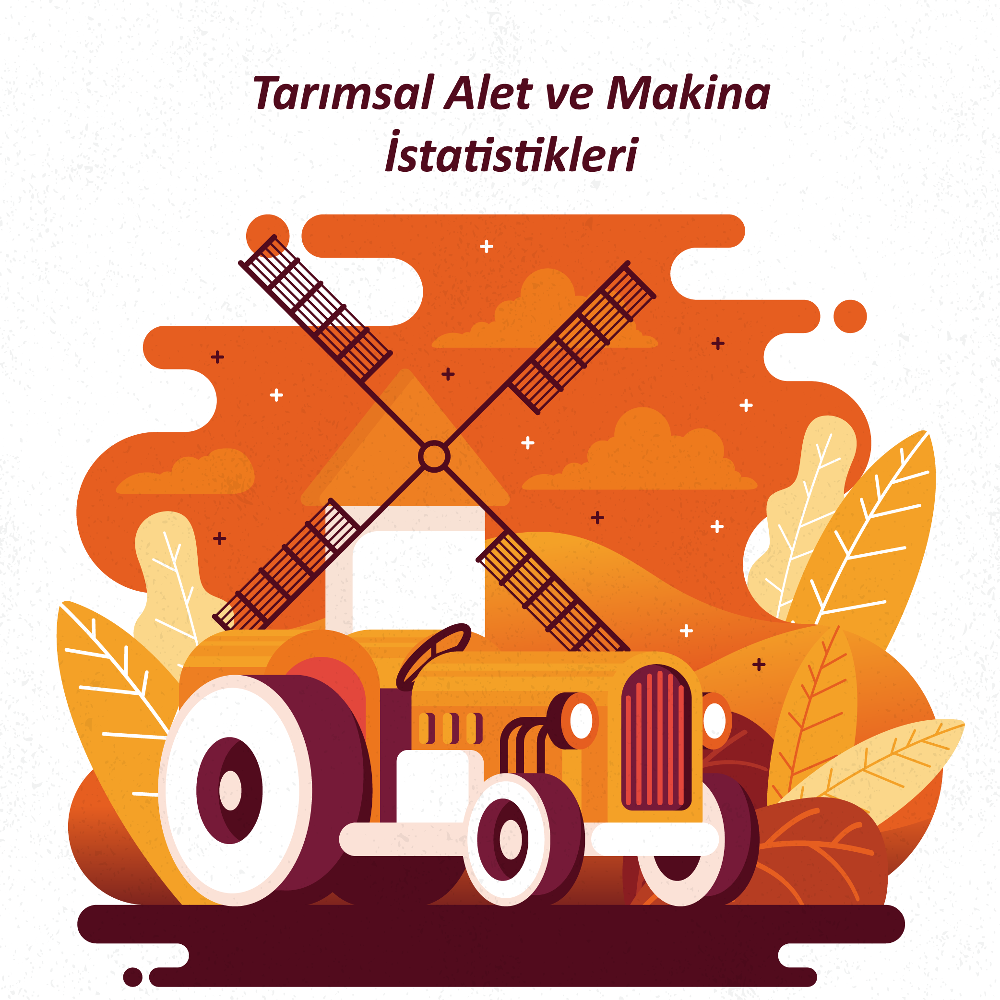

# **TÜİK TARIMSAL ALET VE MAKİNA İSTATİSTİKLERİ**

## **Kütüphanelerin Import Edilmesi**

In [42]:
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point


## **Veri Setinin Yüklenmesi ve İncelenmesi**

In [43]:
df = pd.read_excel("tarım1.xlsx")

### Veri Setinin İncelenmesi

Veri setinde her bölge için *2020-2021-2022-2023* yıllarının alet ve malzeme
sayılarını vermektedir. Sütunların önce bölgeler ardından yıllar için bölünmesinden dolayı *unnamed* sütunlar oluşmuştur. Bunlar kendinden önce gelen bölgeyi temsil etmektedir. Bu durum kodun ilerleyen kısımlarında düzenlenmiştir.

In [44]:
def check_df(dataframe):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("\n##################### Columns #####################")
    print(dataframe.columns)
    print("\n##################### Info #####################")
    dataframe.info()
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head())
    print("##################### Tail #####################")
    print(dataframe.tail())
    print("##################### NA #####################")
    print(dataframe.isnull().sum())

In [45]:
check_df(df)

##################### Shape #####################
(111, 49)

##################### Columns #####################
Index(['Tarımsal Alet ve Makinalar', 'Akdeniz-TR6', 'Unnamed: 2', 'Unnamed: 3',
       'Unnamed: 4', 'Batı Anadolu-TR5', 'Unnamed: 6', 'Unnamed: 7',
       'Unnamed: 8', 'Batı Karadeniz-TR8', 'Unnamed: 10', 'Unnamed: 11',
       'Unnamed: 12', 'Batı Marmara-TR2', 'Unnamed: 14', 'Unnamed: 15',
       'Unnamed: 16', 'Doğu Karadeniz-TR9', 'Unnamed: 18', 'Unnamed: 19',
       'Unnamed: 20', 'Doğu Marmara-TR4', 'Unnamed: 22', 'Unnamed: 23',
       'Unnamed: 24', 'Ege-TR3', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28',
       'Güneydoğu Anadolu-TRC', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32',
       'İstanbul-TR1', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36',
       'Kuzeydoğu Anadolu-TRA', 'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40',
       'Orta Anadolu-TR7', 'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44',
       'Ortadoğu Anadolu-TRB', 'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48']

In [46]:
print(df.describe())

         Akdeniz-TR6     Unnamed: 2     Unnamed: 3     Unnamed: 4  \
count      96.000000      94.000000      94.000000     100.000000   
mean    17451.125000   18533.021277   19414.989362   18993.260000   
std     36067.179263   37633.098812   39457.298321   39484.450618   
min         1.000000      20.000000      18.000000       1.000000   
25%       474.000000     481.500000     582.750000     530.250000   
50%      3294.000000    3965.000000    4125.500000    3336.000000   
75%     14982.250000   17482.250000   18451.000000   19014.500000   
max    243137.000000  253378.000000  262319.000000  270877.000000   

       Batı Anadolu-TR5     Unnamed: 6     Unnamed: 7     Unnamed: 8  \
count         89.000000      90.000000      90.000000      93.000000   
mean       12117.438202   12313.611111   12527.755556   12447.731183   
std        21249.990931   21641.843711   22148.651531   22320.596868   
min            4.000000       2.000000       2.000000       5.000000   
25%          648.0

## **Değişkenlerin Tanımlanması**

Veri setinde Türkiye'nin bölgeleri geleneksel olarak kullanılan yedi coğrafi bölge yerine Türkiye İstatistiki Bölge Birimleri Sınıflandırması'ndaki  (Türkiye İBBS) 12 bölgeden oluşmaktadır. Bunlar:

1.   Akdeniz-TR6
2.   Batı Anadolu-TR5
3.   Batı Karadeniz-TR8
4.   Batı Marmara-TR2
5.   Doğu Karadeniz-TR9
6.   Doğu Marmara-TR4
7.   Ege-TR3
8.   Güneydoğu Anadolu-TRC
9.   İstanbul-TR1
10.   Kuzeydoğu Anadolu-TRA
11.   Orta Anadolu-TR7
12.   Ortadoğu Anadolu-TRB

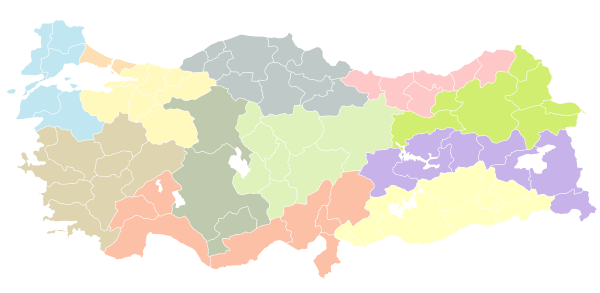

Veri setinde 110 adet tarım alet ve makinası bulunmaktadır. Bunlar:
1.   (Biçerdöver (0-5 Yaş))
1150402. (Biçerdöver (6-10 Yaş))
1150403. (Biçerdöver (11-20 Yaş))
1150404. (Biçerdöver (21 Yaş Ve Üzeri))
1150101. (Karasaban)
1150102. (Hayvan Pulluğu)
1150103. (Kulaklı Traktör Pulluğu)
1150105. (Ark Açma Pulluğu)
1150106. (Diskli Traktör Pulluğu)
1150107. (Diskli Anız Pulluğu (Vanvey))
1150108. (Kulaklı Anız Pulluğu)
1150109. (Toprak Frezesi (Rotovatör))
1150110. (Kültivatör)
1150111. (Merdane)
1150112. (Diskli Tırmık (Diskarolar))
1150113. (Dişli Tırmık)
1150114. (Kombikürüm (Karma Tırmık))
1150115. (Ot Tırmığı)
1150118. (Hayvanla Çekilen Hububat Ekim Makinesi)
1150119. (Traktörle Çekilen Hububat Ekim Makinesi)
1150120. (Kombine Hububat Ekim Makinesi)
1150123. (Patates Dikim Makinesi)
1150124. (Çiftlik Gübresi Dağıtma Makinesi)
1150125. (Kimyevi Gübre Dağıtma Makinesi)
1150126. (Orak Makinesi)
1150127. (Biçer Bağlar Makinesi)
1150128. (Balya Makinesi)
1150130. (Tınaz Makinesi)
1150131. (Döven)
1150134. (Patates Sökme Makinesi)
1150135. (Kombine Patates Hasat Makinesi)
1150136. (Pancar Sökme Makinesi)
1150137. (Kombine Pancar Hasat Makinesi)
1150138. (Hayvanla Çekilen Çayır Biçme Makinesi)
1150139. (Traktörle Çekilen Çayır Biçme Makinesi)
1150140. (Ot Silaj Makinesi)
1150141. (Mısır Silaj Makinesi)
1150142. (Yerfıstığı Hasat Makinesi)
1150143. (Pamuk Toplama Makinesi)
1150144. (Yerfıstığı Harman Makinesi)
1150145. (Fındık Harman Makinesi)
1150146. (Mısır Daneleme Makinesi)
1150147. (Mısır Hasat Makinesi)
1150148. (Selektör (Sabit Veya Seyyar))
1150149. (Yem Hazırlama Makinesi)
1150150. (Sap Parçalama Makinesi)
1150151. (Tarımsal Mücadele Uçağı)
1150153. (Sırt Pülverizatörü)
1150154. (Sedyeli, Motorlu Pülverizatör Tozlayıcı Kombine Atomizör)
1150155. (Kuyruk Milinden Hareketli Pülverizatör)
1150156. (Motorlu Pülverizatör)
1150157. (Tozlayıcı)
1150158. (Atomizör)
1150159. (Santrifüj Pompa)
1150160. (Elektropomp)
1150161. (Motopomp (Termik))
1150162. (Derin Kuyu Pompa)
1150163. (Yağmurlama Tesisi)
1150164. (Krema Makinesi)
1150165. (Kuluçka Makinesi)
1150166. (Civciv Ana Makinesi)
1150167. (Süt Sağım Tesisi)
1150168. (Süt Sağım Makinesi (Seyyar))
1150169. (Römork (Tarım Arabası))
1150170. (Su Tankeri (Tarımda Kullanılan))
1150182. (Dip Kazan (Subsoiler))
1150183. (Rototiller)
1150184. (Taş Toplama Makinesi)
1150185. (Toprak Tesviye Makinesi)
1150186. (Set Yapma Makinesi)
1150187. (Toprak Burgusu)
1150188. (Hayvanla Ve Traktörle Çekilen Ara Çapa Makinesi)
1150189. (Pnömatik Ekim Makinesi)
1150190. (Üniversal Ekim Makinesi (Mekanik) (Pancar Mibzeri Dahil))
1150191. (Anıza Ekim Makinesi)
1150192. (Fide Dikim Makinesi)
1150193. (Sap Döver Ve Harman Makinesi (Batöz))
1150194. (Sap Toplamalı Saman Yapma Makinesi)
1150195. (Saman Aktarma-Boşaltma Makinesi)
1150196. (Motorlu Tırpan)
1150197. (Ürün Kurutma Makinesi)
1150198. (Meyve Hasat Makineleri)
1150199. (Ürün Sınıflandırma Makinesi (Selektör Hariç))
1150200. (Yem Dağıtıcı Römork)
1150201. (Damla Sulama Tesisi)
1150202. (Yayık)
1150203. (Kepçe (Tarımda Kullanılan))
1150204. (Üzüm Savurma Makinesi (Eleme))
1150206. (Motorlu Testere)
1150207. (Üzüm Sergi Toplama Makinesi)
1150208. (Kabak Çekirdeği Hasat Makinesi)
1150209. (Motorlu Çayır Biçma Makinesi (Elle Sürülen))
1150211. (Ceviz Kırma Makinesi)
1150212. (Süt Soğutma Makinesi (Seyyar))
1150213. (Silaj Makinesi (Paketleme))
1150214. (Silaj Römorku (Çift Dingilli))
1150215. (Tandem Dingilli Silaj Römorku)
1150216. (Lazer Tevsiye Aracı)
1150217. (Koyun Kırkma Makinesi)
1150218. (Taş Kırma Makinesi)
1150219. (Üzüm Sıkma Makinesi)
1150301. (Traktör - Paletli (Tırtıllı))
1150302. (Traktör - Tek Akslı (1-5 Bg))
1150303. (Traktör - Tek Akslı (5 Bg'Den Fazla))
1150304. (Traktör - İki Akslı (1-10 Bg))
1150305. (Traktör - İki Akslı (11-24 Bg))
1150306. (Traktör - İki Akslı (25-34 Bg))
1150307. (Traktör - İki Akslı (35-50 Bg))
1150308. (Traktör - İki Akslı (51-70 Bg))
1150309. (Traktör - İki Akslı (70 Bg'Den Fazla))


## **Veri Setinin Düzenlenmesi**


In [47]:
df['Tarımsal Alet ve Makinalar']

0                                                  alet
1                       1150401. (Biçerdöver (0-5 Yaş))
2                      1150402. (Biçerdöver (6-10 Yaş))
3                     1150403. (Biçerdöver (11-20 Yaş))
4               1150404. (Biçerdöver (21 Yaş Ve Üzeri))
                             ...                       
106           1150305. (Traktör - İki Akslı (11-24 Bg))
107           1150306. (Traktör - İki Akslı (25-34 Bg))
108           1150307. (Traktör - İki Akslı (35-50 Bg))
109           1150308. (Traktör - İki Akslı (51-70 Bg))
110    1150309. (Traktör - İki Akslı (70 Bg'Den Fazla))
Name: Tarımsal Alet ve Makinalar, Length: 111, dtype: object

In [48]:
makina_list = df['Tarımsal Alet ve Makinalar'].tolist()
makina_list.remove("alet") #excelde bulunan ve veri setinin bozan bir hücre


Veri setinde bulunan boş hücreler geçerli makina ve aletin o bölgede bulunmadığını göstermektedir. Bu sebeple boş hücreleri 0 ile doldurmak sorunu çözecektir.

In [49]:
df.fillna(0, inplace=True)

In [50]:
bolgeler = ['Akdeniz-TR6', 'Batı Anadolu-TR5', 'Batı Karadeniz-TR8', 'Batı Marmara-TR2', 'Doğu Karadeniz-TR9',
            'Doğu Marmara-TR4', 'Ege-TR3', 'Güneydoğu Anadolu-TRC', 'İstanbul-TR1', 'Kuzeydoğu Anadolu-TRA',
            'Orta Anadolu-TR7', 'Ortadoğu Anadolu-TRB']

In [51]:
def df_parcala(df_index):
  ad_index = df.columns.get_loc(df_index)

  next_column = df.iloc[1:, ad_index:ad_index + 4]
  return next_column


In [52]:
sozluk_bolge = {}
for bolge in bolgeler:
  sozluk_bolge[bolge] = (df_parcala(bolge))
  sozluk_bolge[bolge].columns = ["2020", "2021", "2022", "2023"]
  sozluk_bolge[bolge].insert(0, 'Aletler', df.iloc[:, 0])


In [53]:
for bolge in bolgeler:
  check_df(sozluk_bolge[bolge])

##################### Shape #####################
(110, 5)

##################### Columns #####################
Index(['Aletler', '2020', '2021', '2022', '2023'], dtype='object')

##################### Info #####################
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 1 to 110
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Aletler  110 non-null    object 
 1   2020     110 non-null    float64
 2   2021     110 non-null    float64
 3   2022     110 non-null    float64
 4   2023     110 non-null    float64
dtypes: float64(4), object(1)
memory usage: 4.4+ KB
##################### Types #####################
Aletler     object
2020       float64
2021       float64
2022       float64
2023       float64
dtype: object
##################### Head #####################
                                   Aletler    2020    2021    2022    2023
1          1150401. (Biçerdöver (0-5 Yaş))   279.0   272.0   286.0

In [54]:
sozluk_bolge

{'Akdeniz-TR6':                                               Aletler     2020     2021  \
 1                     1150401. (Biçerdöver (0-5 Yaş))    279.0    272.0   
 2                    1150402. (Biçerdöver (6-10 Yaş))    479.0    479.0   
 3                   1150403. (Biçerdöver (11-20 Yaş))    561.0    573.0   
 4             1150404. (Biçerdöver (21 Yaş Ve Üzeri))    971.0    937.0   
 5                                1150101. (Karasaban)   4794.0   4297.0   
 ..                                                ...      ...      ...   
 106         1150305. (Traktör - İki Akslı (11-24 Bg))   2555.0   2585.0   
 107         1150306. (Traktör - İki Akslı (25-34 Bg))  14823.0  14901.0   
 108         1150307. (Traktör - İki Akslı (35-50 Bg))  67383.0  68301.0   
 109         1150308. (Traktör - İki Akslı (51-70 Bg))  64777.0  68486.0   
 110  1150309. (Traktör - İki Akslı (70 Bg'Den Fazla))  18071.0  20256.0   
 
         2022     2023  
 1      286.0    294.0  
 2      522.0    533.

In [55]:
for bolge in sozluk_bolge:
  sozluk_bolge[bolge] = sozluk_bolge[bolge].T
  sozluk_bolge[bolge] = sozluk_bolge[bolge].drop("Aletler")
  sozluk_bolge[bolge].columns = makina_list

In [56]:
sozluk_bolge

{'Akdeniz-TR6':      1150401. (Biçerdöver (0-5 Yaş)) 1150402. (Biçerdöver (6-10 Yaş))  \
 2020                           279.0                            479.0   
 2021                           272.0                            479.0   
 2022                           286.0                            522.0   
 2023                           294.0                            533.0   
 
      1150403. (Biçerdöver (11-20 Yaş))  \
 2020                             561.0   
 2021                             573.0   
 2022                             591.0   
 2023                             574.0   
 
      1150404. (Biçerdöver (21 Yaş Ve Üzeri)) 1150101. (Karasaban)  \
 2020                                   971.0               4794.0   
 2021                                   937.0               4297.0   
 2022                                   979.0               4080.0   
 2023                                   979.0               3587.0   
 
      1150102. (Hayvan Pulluğu) 1150103. (Ku

## **Veri Setinin Görselleştirilmesi**


*df.describe()* fonksiyonunda *max* ve *min* arasındaki farkın çok büyük olduğu görülüyor. Bu sebeple grafikleri çizdirirken *ymax*'ı belirlemek daha uygun oldu. *ymax* değeri belirlenmiş olduğu için ülkemizde fazlaca bulunan tarımsal alet ve makinaları açıkça görebiliyoruz.

### Veri Setinin *Matplotlib* Kütüphanesi İle *Çizgi Grafiğinin* Oluşturulması

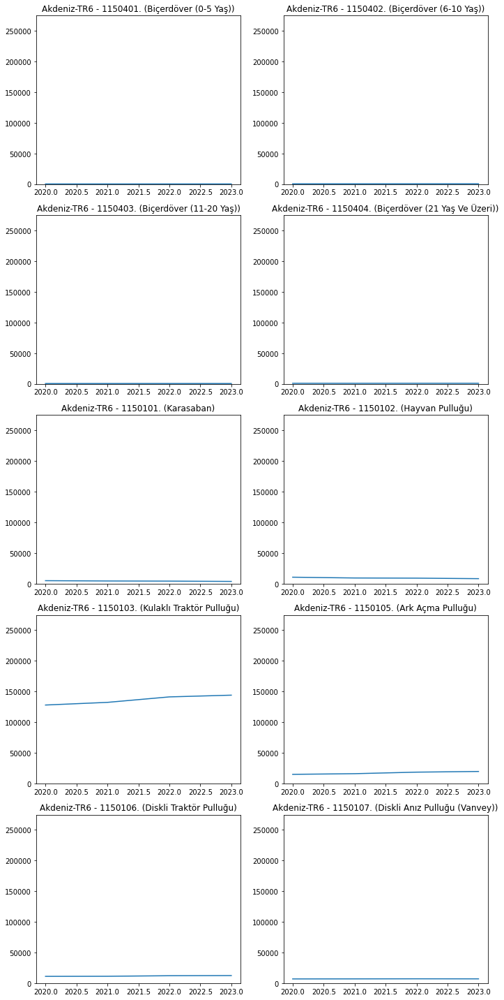

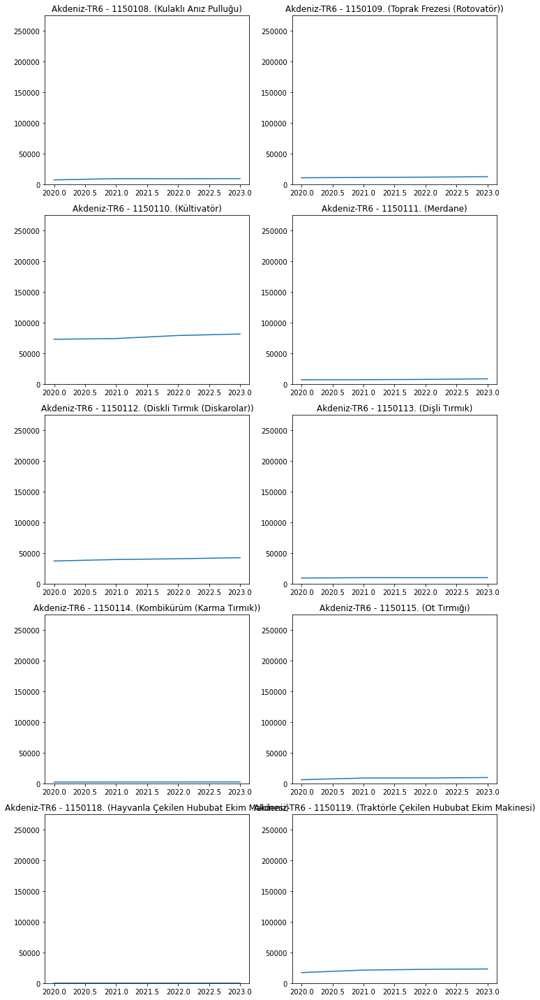

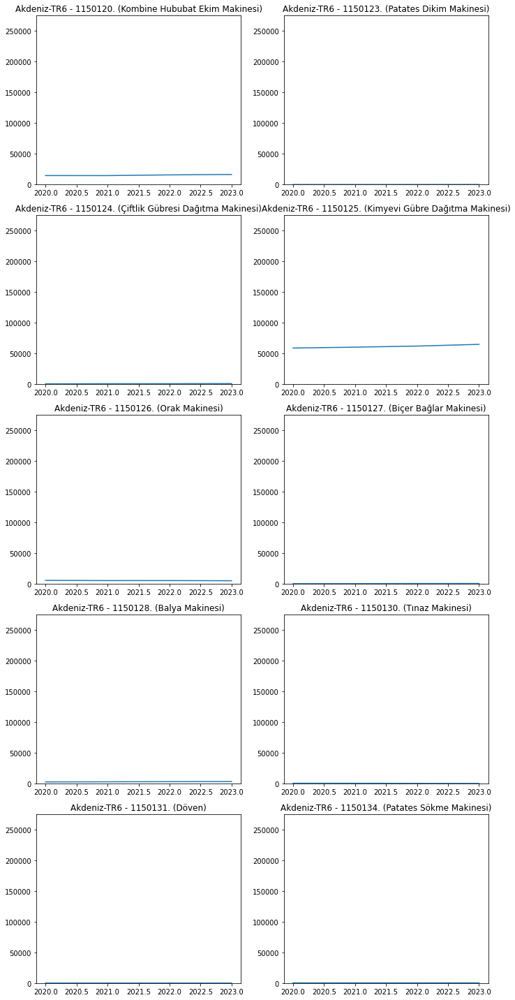

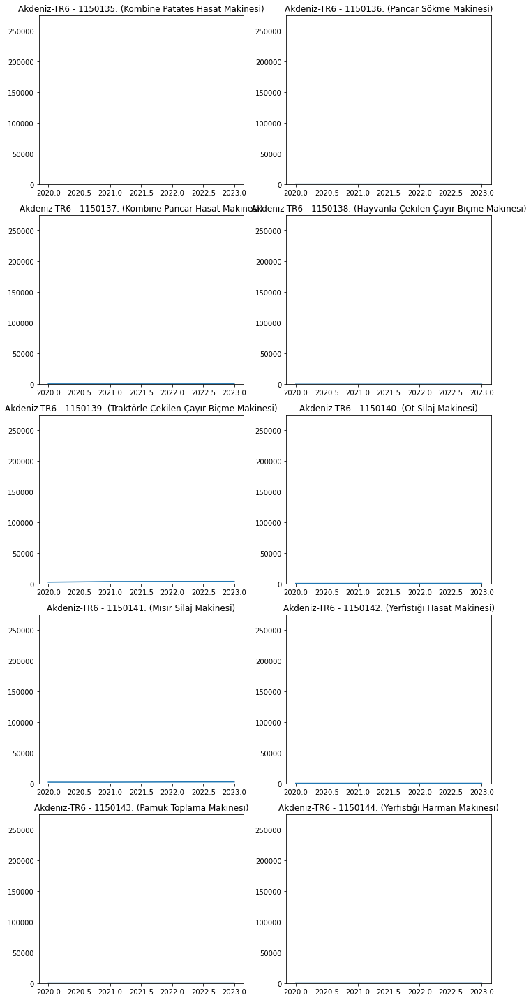

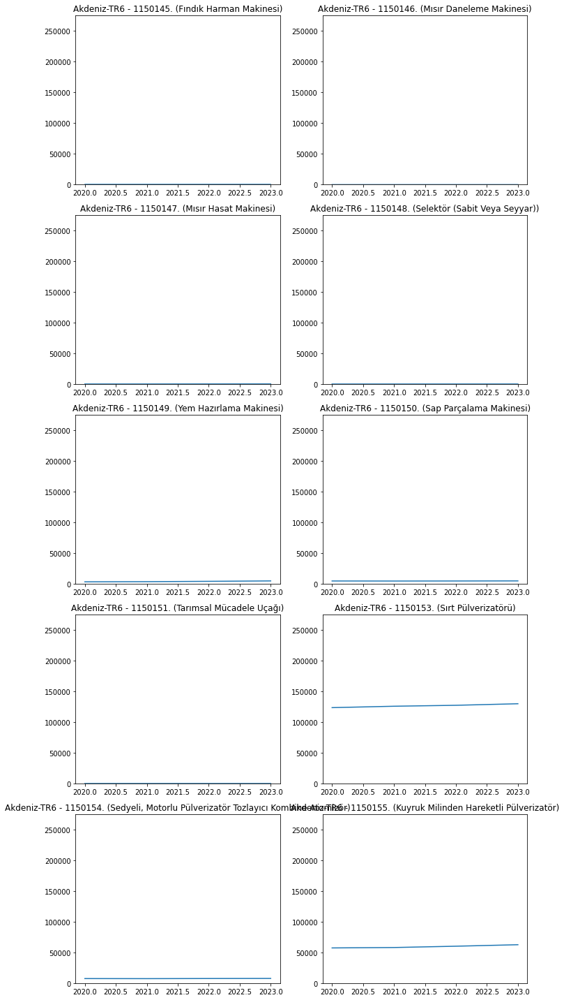

...

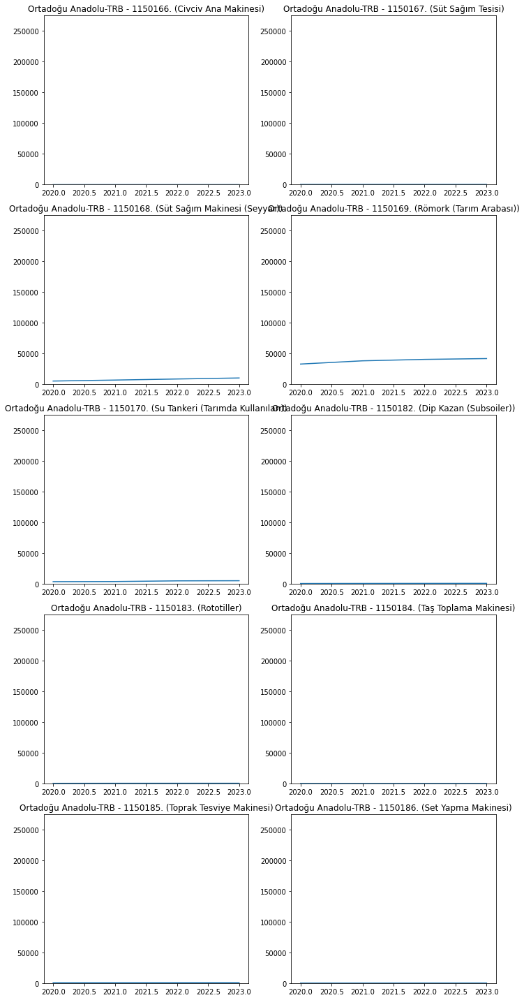

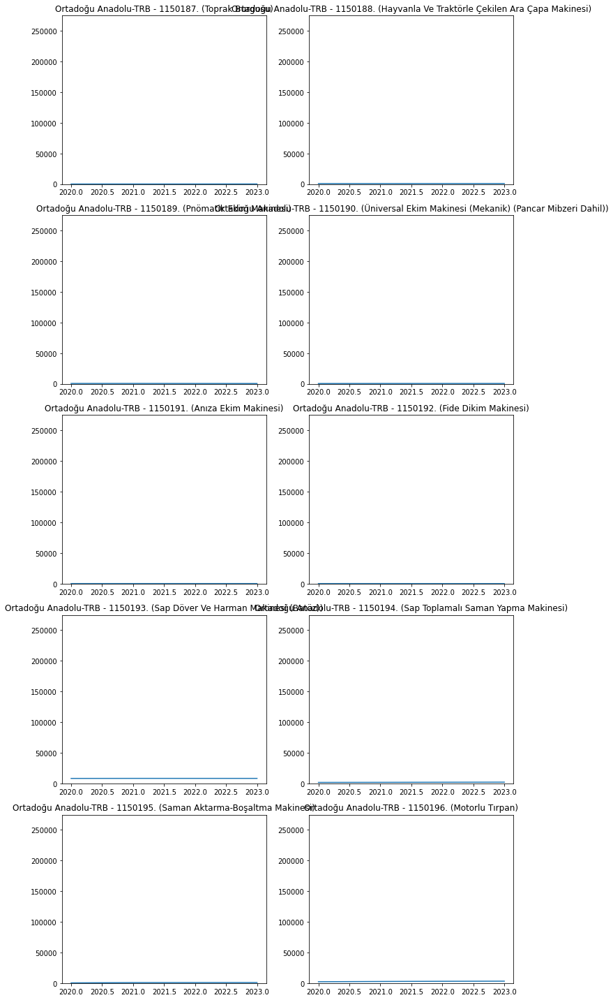

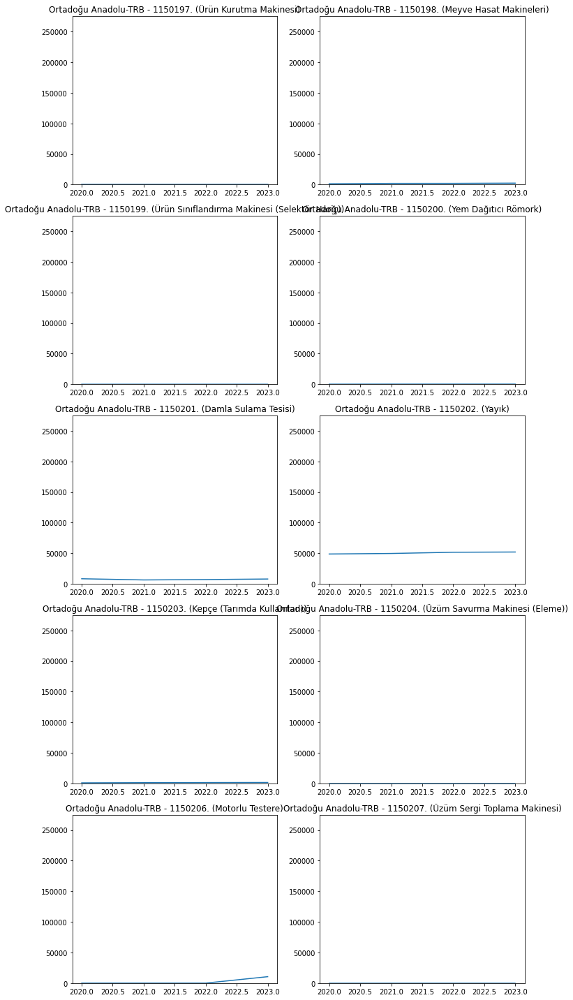

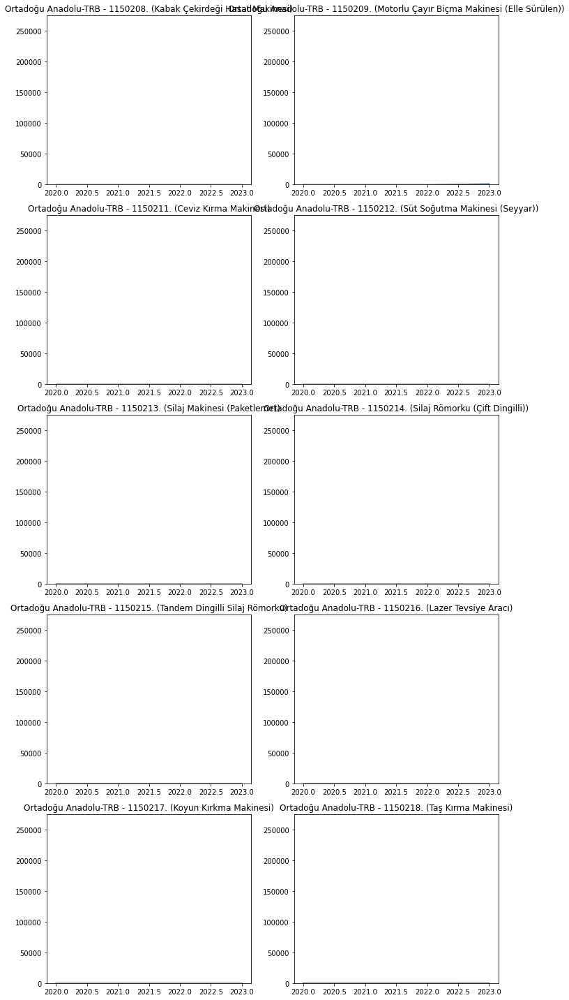

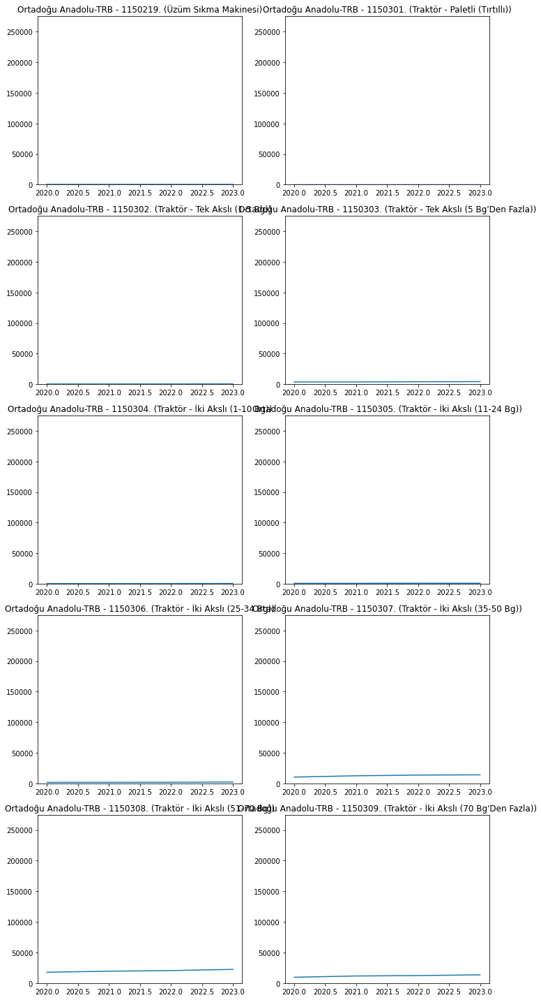

In [58]:
grafik_sayisi = 10
list_year = [2020, 2021, 2022, 2023]

for bolge in sozluk_bolge:
    sutun_sayisi = len(sozluk_bolge[bolge].columns)

    figur_sayisi = sutun_sayisi // grafik_sayisi + (sutun_sayisi % grafik_sayisi > 0)

    for fig_no in range(figur_sayisi):

        fig, axs = plt.subplots(grafik_sayisi // 2, 2, figsize=(10, 20))

        for idx in range(grafik_sayisi):
            column_idx = fig_no * grafik_sayisi + idx

            if column_idx >= sutun_sayisi:
                break

            column = sozluk_bolge[bolge].columns[column_idx]
            ax = axs[idx // 2, idx % 2]
            ax.plot(list_year, sozluk_bolge[bolge][column].astype(float))
            ax.set_ylim(ymin=0, ymax=275000)
            ax.set_title(f"{bolge} - {column}")

        plt.tight_layout()

        plt.show()

### Veri Setinin *Matplotlib* Kütüphanesi İle *Balon Garafiğinin* Oluşturulması

2023 yılında Türkiye'de bulunan tarımsal alet ve makinaların balon grafiği yardımıyla harita üzerinde bölgesel dağılımları gösterilmiştir.

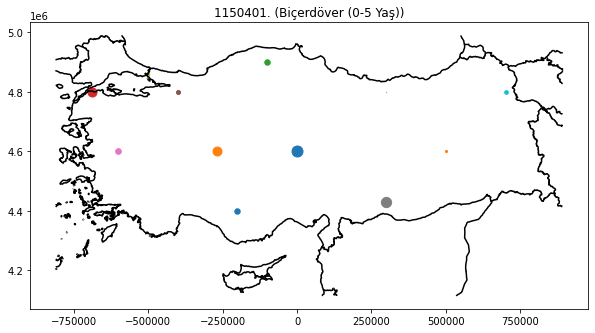

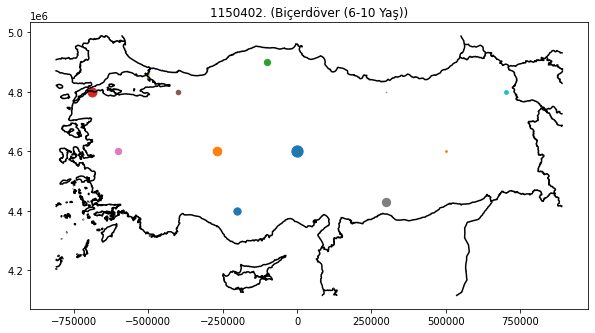

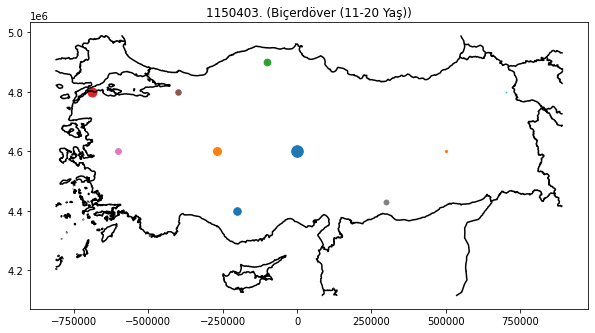

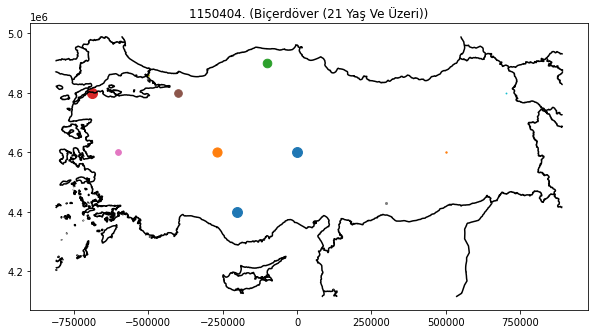

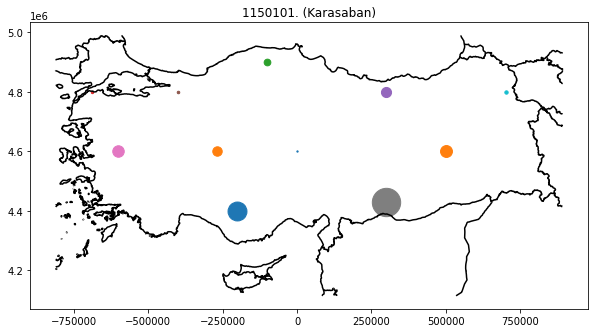

...

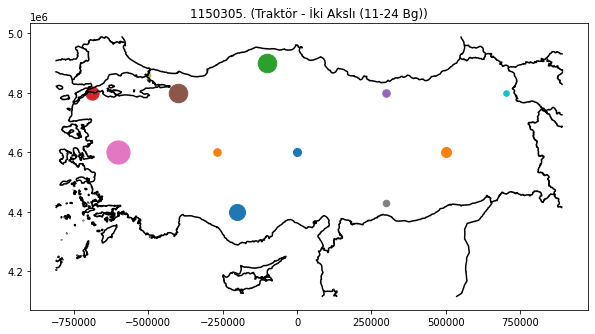

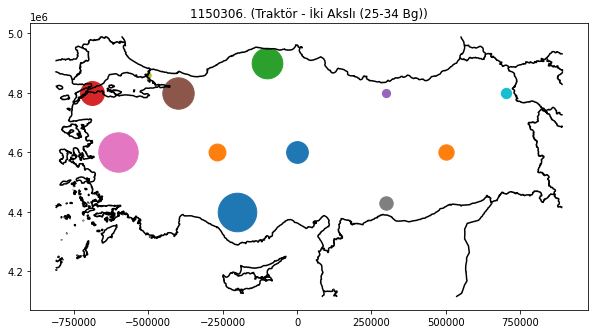

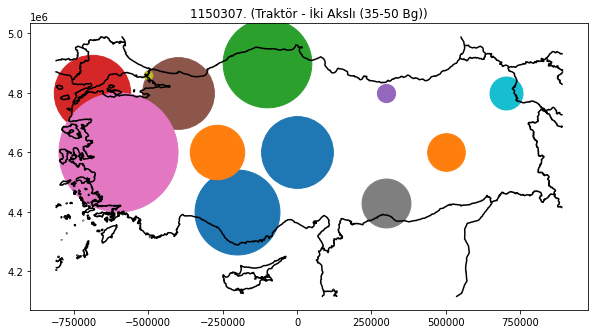

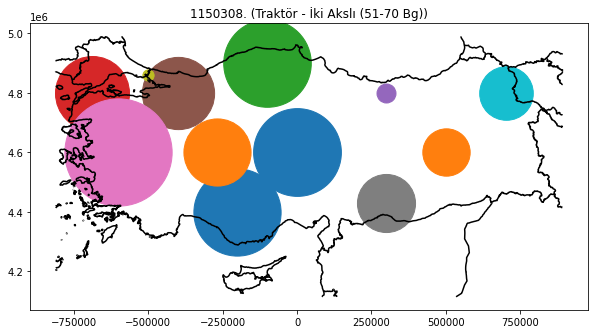

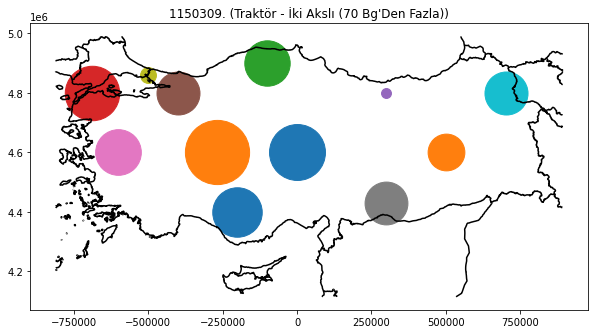

In [ ]:
turkey_map = gpd.read_file('İl_İlçe_Sınır_Ve_Yerleşim_Verisi\Ülke_Sınırı.shp')

#bolgelerin koordinatları girilmiştir.
points = [Point(xy) for xy in [(-200000, 4400000), (-270000, 4600000), (-100000, 4900000),
                               (-690000, 4800000), (300000, 4800000), (-400000, 4800000),
                               (-600000, 4600000), (300000, 4430000), (-500000, 4860000),
                               (700000, 4800000), (0, 4600000), (500000, 4600000)]]
geo_df = gpd.GeoDataFrame(crs=turkey_map.crs, geometry=points)

veri_sozluk = {}

for alet in sozluk_bolge[bolge]:
  for bolge in sozluk_bolge:
    veri_sozluk.update({bolge: sozluk_bolge[bolge][alet][3]})

  fig, ax = plt.subplots(figsize=(10, 10))
  turkey_map.plot(ax=ax, color='black', edgecolor='black')

  for i, point in enumerate(geo_df.geometry):
    ax.set_title(f"{alet}")
    ax.scatter(point.x, point.y, s=veri_sozluk[bolgeler[i]] / 10, label=bolgeler[i])
  plt.show()
